<a href="https://colab.research.google.com/github/thiagofuruchima/olx_downloader/blob/main/Cars_ResNet50v2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import random
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import time

In [2]:
print(tf.config.list_physical_devices('GPU'))

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [3]:
train_dir = 'img/train'
test_dir = 'img/test'
valid_dir = 'img/valid'

In [4]:
BATCH_SIZE = 256
IMG_SHAPE  = (224, 224)

In [5]:
image_generator_train = ImageDataGenerator(rescale=1./255,
                                           horizontal_flip=True,
                                           zoom_range=0.3,
                                           rotation_range=60,
                                           width_shift_range=0.2,
                                           height_shift_range=0.2)

train_generator = image_generator_train.flow_from_directory(directory=train_dir,
                                                     batch_size=BATCH_SIZE, 
                                                     shuffle=True, 
                                                     target_size=IMG_SHAPE,
                                                     class_mode='sparse')

num_training_classes = train_generator.num_classes
num_training_intances = len(train_generator.filenames)
num_training_intances, num_training_classes

Found 62093 images belonging to 129 classes.


(62093, 129)

In [6]:
image_generator_val = ImageDataGenerator(rescale=1./255)

val_generator = image_generator_val.flow_from_directory(directory=valid_dir,
                                                 batch_size=BATCH_SIZE,
                                                 shuffle=True,
                                                 target_size=IMG_SHAPE,
                                                 class_mode='sparse')

Found 20698 images belonging to 129 classes.


In [7]:
image_generator_test = ImageDataGenerator(rescale=1./255)

test_generator = image_generator_test.flow_from_directory(directory=test_dir,
                                                 batch_size=1,
                                                 shuffle=True,
                                                 target_size=IMG_SHAPE,
                                                 class_mode='sparse')

Found 20698 images belonging to 129 classes.


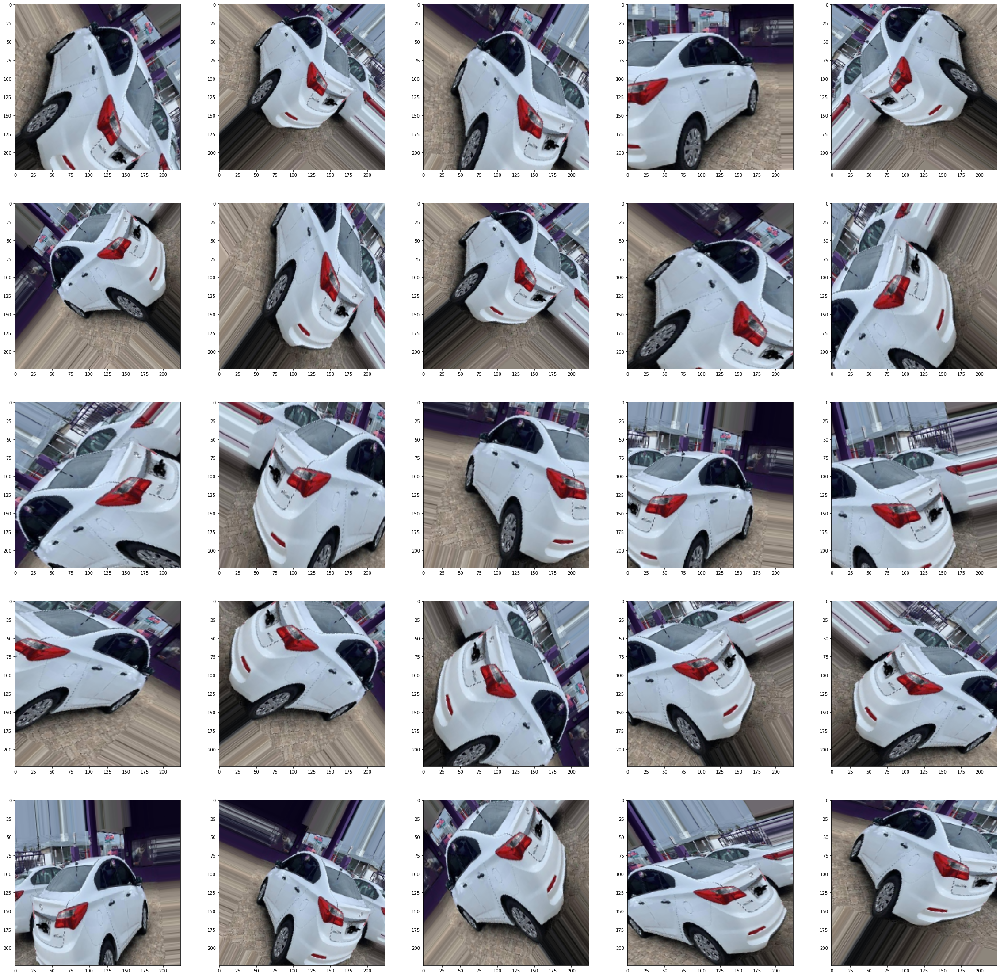

In [8]:
random_img = random.randint(0, BATCH_SIZE)
columns = 5
rows = 5
fig=plt.figure(figsize=(40, 40))
for i in range(1, columns * rows + 1):
    fig.add_subplot(rows, columns, i)
    augmented_image = train_generator[0][0][random_img]
    plt.imshow(augmented_image)
plt.show()

In [9]:
IMG_SIZE = (224, 224)
IMG_SHAPE = (IMG_SIZE + (3,))
base_model = tf.keras.applications.ResNet50V2(input_shape=IMG_SHAPE,
                                               include_top=False, # Do not include the ImageNet classifier at the top.
                                               weights='imagenet') # Load weights pre-trained on ImageNet.
# Freeze the base_model
base_model.trainable = False

# Print the architecture
base_model.summary()

Model: "resnet50v2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
pool1_pad (ZeroPadding2D)       (None, 114, 114, 64) 0           conv1_conv[0][0]                 
_________________________________________________________________________________________

In [10]:
inputs = tf.keras.Input(shape=IMG_SHAPE)
x = base_model(inputs, training=False)
x = tf.keras.layers.GlobalAvgPool2D()(x)
x = tf.keras.layers.Dropout(.2)(x)
outputs = tf.keras.layers.Dense(num_training_classes,
                               activation=tf.keras.activations.softmax,
                               kernel_regularizer=tf.keras.regularizers.l2(0.001))(x)
model = tf.keras.models.Model(inputs, outputs)
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
resnet50v2 (Functional)      (None, 7, 7, 2048)        23564800  
_________________________________________________________________
global_average_pooling2d (Gl (None, 2048)              0         
_________________________________________________________________
dropout (Dropout)            (None, 2048)              0         
_________________________________________________________________
dense (Dense)                (None, 129)               264321    
Total params: 23,829,121
Trainable params: 264,321
Non-trainable params: 23,564,800
_________________________________________________________________


In [11]:
# Define the optimizer, loss and metrics
LEARNING_RATE = 0.01

model.compile(optimizer=tf.keras.optimizers.SGD(lr=LEARNING_RATE, momentum=0.9, decay=1e-3),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(),
              metrics=['accuracy'])

In [12]:
# Define EarlyStopping as the strategy to avoid overfitting
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = 'val_loss', 
                                                  patience = 10,
                                                  restore_best_weights=True, min_delta=0.01)

In [13]:
# Define ReduceLROnPlateau as the learning schedule strategy
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(factor = 0.5,
                                                    patience = 2)

In [15]:
class PrintSGDLR(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        lr = self.model.optimizer.lr
        decay = self.model.optimizer.decay
        iterations = self.model.optimizer.iterations
        lr_with_decay = lr / (1. + decay * tf.keras.backend.cast(iterations, tf.keras.backend.dtype(decay)))
        print("Learning Rate = ", tf.keras.backend.eval(lr_with_decay))

In [16]:
model_name = time.strftime("%d_%m_%Y-%H_%M_%S")
model_checkpoint = tf.keras.callbacks.ModelCheckpoint('checkpoints/' + model_name + '.h5', 
                                                      monitor = 'val_loss',
                                                      save_best_only=True,
                                                      verbose=1)

In [17]:
# Compute the class weights
from sklearn.utils import class_weight

class_weights = dict(enumerate(class_weight.compute_class_weight('balanced',
                                                                 classes=np.unique(train_generator.classes), 
                                                                 y=train_generator.classes)))
class_weights

{0: 1.2600551970453346,
 1: 1.0816653601602648,
 2: 0.8130761575529017,
 3: 0.8214011694049792,
 4: 1.2003518335943089,
 5: 1.5527131782945736,
 6: 1.0007091169881868,
 7: 1.8656631212066583,
 8: 2.3141398330351817,
 9: 0.8504259457090421,
 10: 2.5878552971576227,
 11: 1.0007091169881868,
 12: 1.1711461928742526,
 13: 0.7995699090885678,
 14: 0.8158323479174878,
 15: 0.8200018488438123,
 16: 1.4283118257309135,
 17: 1.7129575988303125,
 18: 1.129908650871638,
 19: 0.8270465382668691,
 20: 0.7509221299084522,
 21: 2.506984819121447,
 22: 1.756719289311379,
 23: 0.7801314185920872,
 24: 0.7701457364341086,
 25: 1.7314427527745246,
 26: 0.8049182027948458,
 27: 0.795605099622013,
 28: 0.8049182027948458,
 29: 0.7738602657095142,
 30: 0.7995699090885678,
 31: 0.7982439225063314,
 32: 1.9025339338787266,
 33: 0.7903794503634118,
 34: 0.8214011694049792,
 35: 1.2185850260033362,
 36: 0.9328315606033292,
 37: 2.207986629684944,
 38: 1.0197904348968598,
 39: 0.8327700437220031,
 40: 0.80223514

In [18]:
EPOCHS = 20

history = model.fit(train_generator,
                    epochs=EPOCHS,
                    callbacks=[early_stopping, lr_scheduler, PrintSGDLR()],
                    validation_data=val_generator,
                    class_weight=class_weights
                   )

Epoch 1/20
243/243 [==============================] - 683s 3s/step - loss: 5.1746 - accuracy: 0.0309 - val_loss: 4.2803 - val_accuracy: 0.1129
Learning Rate =  0.008045052
Epoch 2/20
243/243 [==============================] - 647s 3s/step - loss: 4.4595 - accuracy: 0.0851 - val_loss: 4.0165 - val_accuracy: 0.1581
Learning Rate =  0.0067294748
Epoch 3/20
243/243 [==============================] - 675s 3s/step - loss: 4.2499 - accuracy: 0.1094 - val_loss: 3.9153 - val_accuracy: 0.1791
Learning Rate =  0.0057836897
Epoch 4/20
243/243 [==============================] - 649s 3s/step - loss: 4.1437 - accuracy: 0.1242 - val_loss: 3.8310 - val_accuracy: 0.1929
Learning Rate =  0.0050709937
Epoch 5/20
243/243 [==============================] - 661s 3s/step - loss: 4.0591 - accuracy: 0.1351 - val_loss: 3.7950 - val_accuracy: 0.2041
Learning Rate =  0.0045146723
Epoch 6/20
243/243 [==============================] - 667s 3s/step - loss: 4.0238 - accuracy: 0.1441 - val_loss: 3.7573 - val_accuracy: 

<AxesSubplot:>

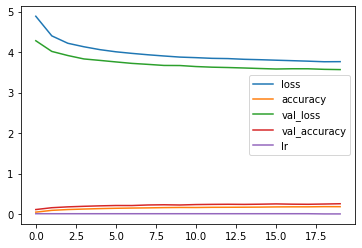

In [19]:
pd.DataFrame(history.history).plot()

In [20]:
model.evaluate(test_generator)

20698/20698 [==============================] - 398s 19ms/step - loss: 3.5672 - accuracy: 0.2559


[3.5671935081481934, 0.25587013363838196]

In [32]:
base_model.trainable = True

# Let's take a look to see how many layers are in the base model
print("Number of layers in the base model: ", len(base_model.layers))

# Fine tune from this layer onwards
fine_tune_at = 80

# Freeze all the layers before the `fine_tune_at` layer
for layer in base_model.layers[:fine_tune_at]:
    layer.trainable =  False

Number of layers in the base model:  190


In [33]:
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
resnet50v2 (Functional)      (None, 7, 7, 2048)        23564800  
_________________________________________________________________
global_average_pooling2d (Gl (None, 2048)              0         
_________________________________________________________________
dropout (Dropout)            (None, 2048)              0         
_________________________________________________________________
dense (Dense)                (None, 129)               264321    
Total params: 23,829,121
Trainable params: 22,551,425
Non-trainable params: 1,277,696
_________________________________________________________________


In [34]:
# Define the optimizer, loss and metrics
model.compile(optimizer=tf.keras.optimizers.SGD(lr = LEARNING_RATE/5, momentum = 0.99, decay=1e-4),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(),
              metrics=['accuracy'])

In [35]:
fine_tune_epochs = 200
total_epochs =  early_stopping.stopped_epoch + fine_tune_epochs

history_fine = model.fit(train_generator,
                    epochs=total_epochs,
                    initial_epoch = 0,
                    callbacks=[early_stopping, lr_scheduler, PrintSGDLR()],
                    validation_data=val_generator)

Epoch 1/200
243/243 [==============================] - 710s 3s/step - loss: 3.6763 - accuracy: 0.1931 - val_loss: 2.5324 - val_accuracy: 0.4012
Learning Rate =  0.001952553
Epoch 2/200
243/243 [==============================] - 674s 3s/step - loss: 2.7910 - accuracy: 0.3454 - val_loss: 1.9835 - val_accuracy: 0.5176
Learning Rate =  0.0019073051
Epoch 3/200
243/243 [==============================] - 658s 3s/step - loss: 2.2663 - accuracy: 0.4589 - val_loss: 1.6345 - val_accuracy: 0.5990
Learning Rate =  0.0018641066
Epoch 4/200
243/243 [==============================] - 665s 3s/step - loss: 1.9040 - accuracy: 0.5383 - val_loss: 1.4199 - val_accuracy: 0.6587
Learning Rate =  0.0018228218
Epoch 5/200
243/243 [==============================] - 694s 3s/step - loss: 1.6878 - accuracy: 0.5884 - val_loss: 1.2590 - val_accuracy: 0.7018
Learning Rate =  0.0017833259
Epoch 6/200
243/243 [==============================] - 688s 3s/step - loss: 1.5038 - accuracy: 0.6375 - val_loss: 1.1262 - val_accu

243/243 [==============================] - 652s 3s/step - loss: 0.2288 - accuracy: 0.9477 - val_loss: 0.4288 - val_accuracy: 0.9155
Learning Rate =  1.4424853e-05
Epoch 49/200
243/243 [==============================] - 623s 3s/step - loss: 0.2324 - accuracy: 0.9468 - val_loss: 0.4269 - val_accuracy: 0.9153
Learning Rate =  1.4264847e-05
Epoch 50/200
243/243 [==============================] - 625s 3s/step - loss: 0.2309 - accuracy: 0.9476 - val_loss: 0.4236 - val_accuracy: 0.9155
Learning Rate =  1.4108354e-05


<AxesSubplot:>

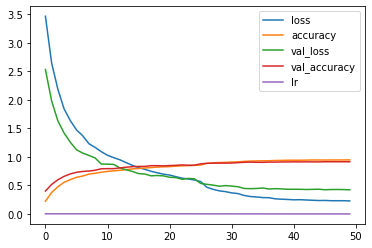

In [36]:
pd.DataFrame(history_fine.history).plot()

In [37]:
model.evaluate(test_generator)

20698/20698 [==============================] - 336s 16ms/step - loss: 0.4140 - accuracy: 0.9140


[0.41399112343788147, 0.9139530658721924]

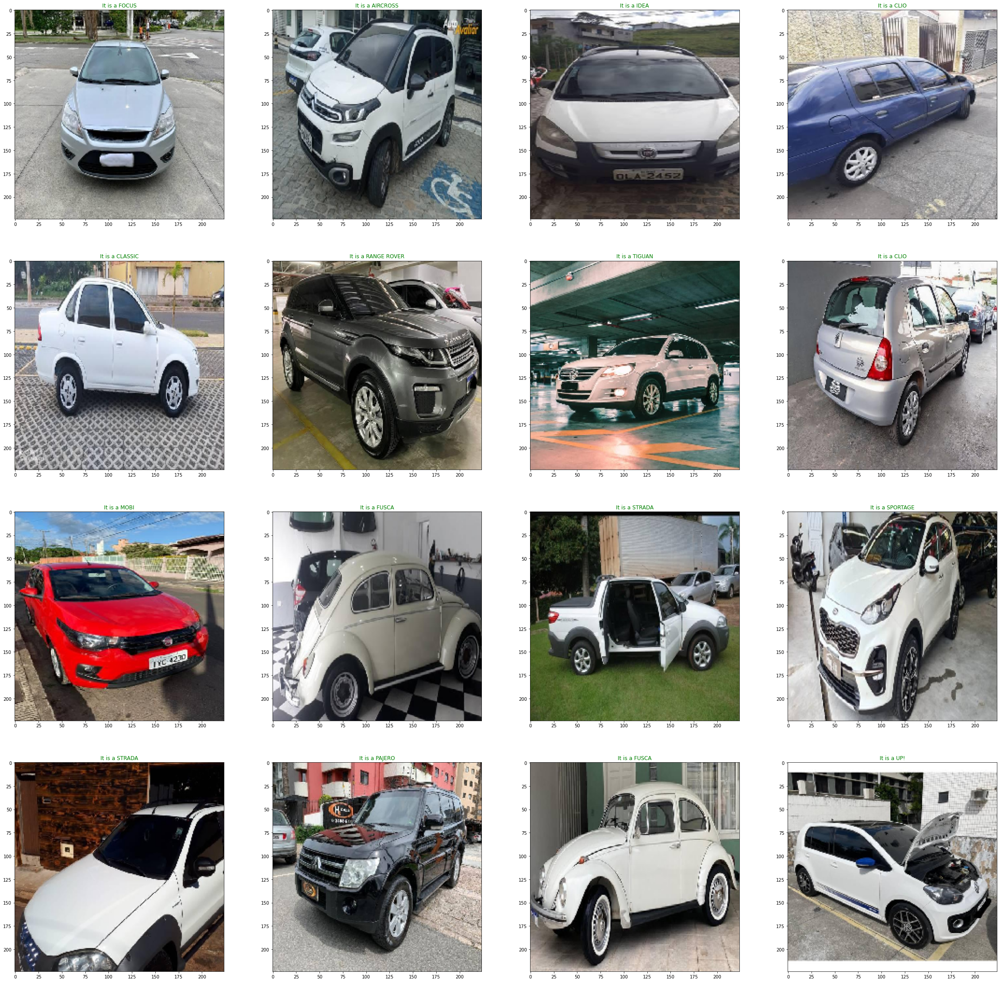

In [38]:
columns = 4
rows = 4
fig=plt.figure(figsize=(40, 40))

class_descriptions = list(test_generator.class_indices.keys())

# Iterate in rows and columns
for i in range(1, columns * rows + 1):
    
    # reserve an spot for the image
    fig.add_subplot(rows, columns, i)
    
    # retrieves the test image and the true label
    img, true_label = test_generator.next()
    
    # makes the prediction using the image
    predicted_label = np.argmax(model.predict(img), axis=-1)[0]
    
    # get a description for the prediction
    prediction_description = class_descriptions[predicted_label]
    
    # get a description for the true value
    true_description = class_descriptions[int(true_label)]
    
    # set the title according to the prediction
    if true_label == predicted_label:
        plt.title("It is a {}".format(prediction_description), color='green')
    else:
        plt.title("Predicted: {} \n What really is: {}".format(prediction_description, true_description), color='red')    
    
    # plot the image
    plt.imshow(img[0])
    
# show the plot
plt.show()

In [39]:
test_generator.reset()

true_labels, predicted_labels = [], []

total_imgs = len(test_generator.filenames)
idx = 0
while idx < total_imgs:
    img, true_label = test_generator.next()
    true_labels.append(true_label)
    predicted_labels.append(np.argmax(model.predict(img), axis=-1)[0])
    idx += 1
    if idx % 10==0:
        print('.', end='')

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

In [40]:
from sklearn.metrics import classification_report, confusion_matrix

print(classification_report(true_labels, predicted_labels, target_names=class_descriptions))

              precision    recall  f1-score   support

        2008       0.98      0.96      0.97       125
         206       0.92      0.94      0.93       167
         207       0.96      0.97      0.96       198
         208       0.98      0.96      0.97       200
         307       0.97      0.89      0.93       124
         308       0.97      0.95      0.96       119
        320I       0.85      0.94      0.89       135
         408       0.95      0.96      0.96        80
         500       0.97      1.00      0.99        74
          A3       0.86      0.87      0.87       202
          A4       0.76      0.71      0.73        78
       AGILE       0.94      0.96      0.95       198
    AIRCROSS       0.91      0.98      0.94       156
      AMAROK       0.98      0.97      0.98       188
        ARGO       0.98      0.97      0.98       191
       ASTRA       0.95      0.92      0.94       221
         ASX       0.95      0.96      0.96       107
       BRAVO       0.92    

In [41]:
model.save('models/car_classifier_resnet50v2_129types_91percert.h5')